In [1]:
import os 
import numpy as np
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from copy import deepcopy
from scipy.spatial.distance import pdist
import itertools as it 
os.chdir('..')
from src.data_cleaning import *
from src.autograd_mds import *
from autograd import grad, elementwise_grad 
from loguru import logger
import sys

from matplotlib.collections import LineCollection

from sklearn import manifold
from sklearn.metrics import euclidean_distances
from sklearn.decomposition import PCA
from sklearn.utils import check_random_state
from sklearn.manifold import MDS
# Unused but required import for doing 3d projections with matplotlib < 3.2
import mpl_toolkits.mplot3d  # noqa: F401
import warnings


In [2]:
os.listdir()


['.git',
 '.gitignore',
 'config',
 'data',
 'doc',
 'Dockerfile',
 'notebook',
 'pyproject.toml',
 'README.md',
 'requirements.txt',
 'src',
 'test']

In [3]:
url = 'http://cs.bc.edu/~prudhome/AAPLD/animal-similarity.csv'

raw_dataset = pd.read_csv(url, index_col=0)
list_of_animal_pairs = raw_dataset.index.str.split('~')

In [4]:
dissimilarity_weights = [np.exp(-1*x) for x in raw_dataset['Average_Rating']]


In [5]:
weighted_list_of_animal_pairs = [x+ [dissimilarity_weights[_]] for _, x in enumerate(list_of_animal_pairs)]

In [6]:
animal_pair_data = pd.DataFrame.from_records(list_of_animal_pairs, columns=['first_animal', 'second_animal'], index= raw_dataset.index)

In [7]:
animal_pair_data.sort_values(by = ['first_animal', 'second_animal'], inplace=True)

In [8]:
unique_animals = set(animal_pair_data.first_animal).union(animal_pair_data.second_animal)

In [9]:
animal_pairs = nx.Graph()
animal_pairs.add_nodes_from(unique_animals)
animal_pairs.add_weighted_edges_from(weighted_list_of_animal_pairs)

In [10]:
low_degree=[k for k,v in animal_pairs.degree._nodes.items() if len(v) < 32]

In [11]:
animal_pairs.remove_nodes_from(low_degree)

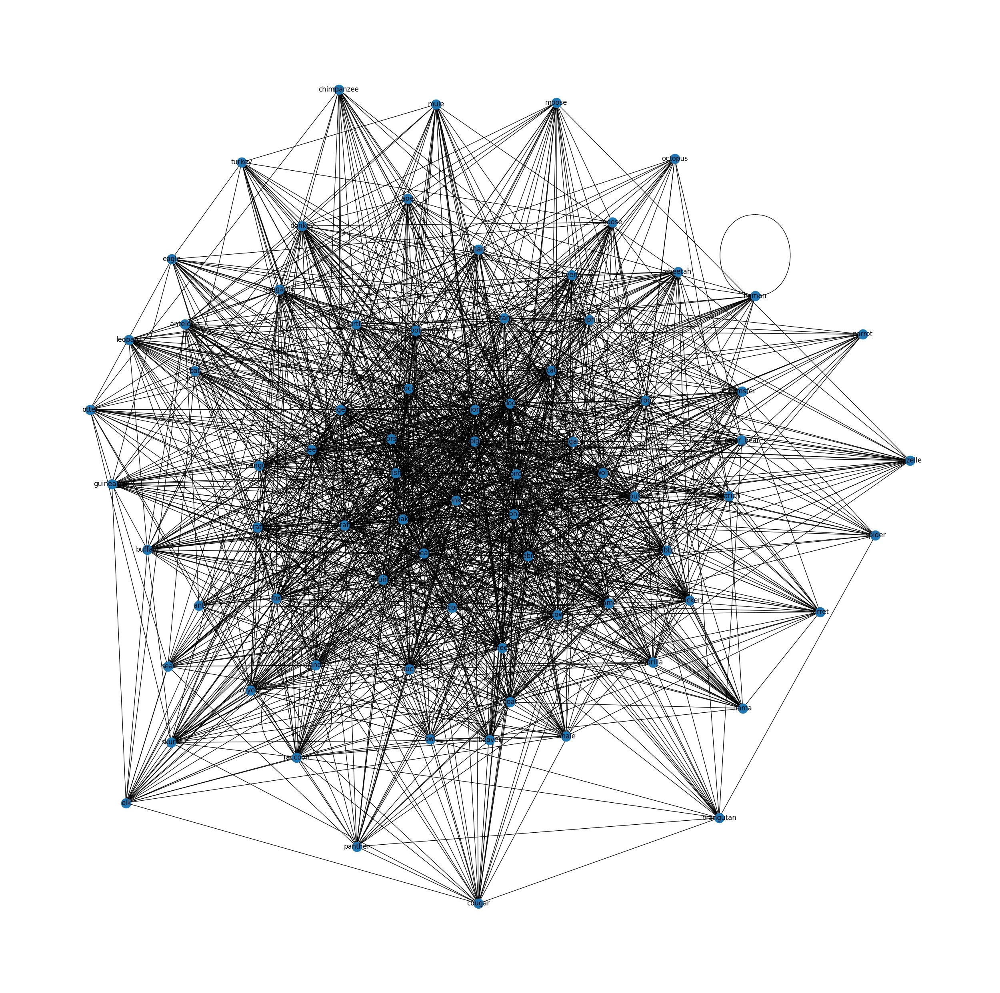

In [12]:
fig, ax = plt.subplots(figsize=(32,32))
nx.draw(animal_pairs, with_labels=True, ax=ax)

plt.show()

In [13]:
connected_list = [x for x in animal_pairs.nodes]

In [14]:
# try the small list, or, failing that, just the apes

In [15]:
smaller_animal_pair_data=animal_pair_data.loc[animal_pair_data['first_animal' ].isin( connected_list) & animal_pair_data['second_animal' ].isin( connected_list) ] 

In [16]:
joined_data=smaller_animal_pair_data.join(raw_dataset).drop(columns='[All_Ratings]')

In [17]:
big_matrix = pd.DataFrame(index=connected_list, columns = connected_list)

In [18]:
joined_data

,first_animal,second_animal,Average_Rating
Pair,,,
alligator~antelope,alligator,antelope,1.940
alligator~bird,alligator,bird,2.080
alligator~buffalo,alligator,buffalo,1.080
alligator~elephant,alligator,elephant,1.140
alligator~fish,alligator,fish,1.000
...,...,...,...
zebra~seal,zebra,seal,1.040
zebra~shark,zebra,shark,1.067
zebra~snake,zebra,snake,1.880


In [19]:
#TODO wrap below section into functions

In [20]:
for row in joined_data.iterrows():
    big_matrix.loc[row[1].first_animal][row[1].second_animal] = row[1].Average_Rating
    big_matrix.loc[row[1].second_animal][row[1].first_animal] = row[1].Average_Rating

In [21]:
big_matrix = big_matrix.astype(float)

In [22]:
# big_matrix = big_matrix[big_matrix.isna().mean(1) < 0.5]
# big_matrix = big_matrix[big_matrix.index.to_list()]

In [23]:
big_matrix = big_matrix[big_matrix.isna().mean(1) < 0.33]

In [24]:
big_matrix = big_matrix[big_matrix.index.to_list()]

In [25]:
plt.matshow(big_matrix)

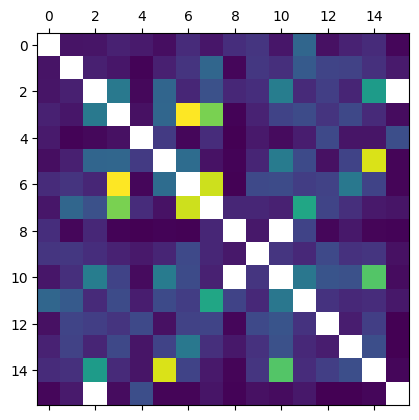

In [26]:
plt.show()

In [27]:
big_matrix.isna().mean(1)

monkey      0.0625
pig         0.0625
cow         0.1250
tiger       0.0625
snake       0.0625
zebra       0.0625
lion        0.0625
cat         0.0625
bird        0.1250
elephant    0.0625
deer        0.1250
dog         0.0625
bear        0.0625
giraffe     0.0625
horse       0.0625
fish        0.1250
dtype: float64

In [28]:
big_matrix.shape

(16, 16)

In [29]:
big_matrix

,monkey,pig,cow,tiger,snake,zebra,lion,cat,bird,elephant,deer,dog,bear,giraffe,horse,fish
monkey,NaN,1.280,1.290,1.480,1.38,1.200,1.640,1.320,1.68,1.810,1.32,2.720,1.240,1.500,1.640,1.100
pig,1.28,NaN,1.460,1.320,1.06,1.460,1.780,2.717,1.10,1.840,1.70,2.480,2.080,2.020,1.720,1.370
cow,1.29,1.460,NaN,3.117,1.11,2.700,1.560,2.300,1.58,1.683,3.22,1.620,1.960,1.540,3.860,NaN
tiger,1.48,1.320,3.117,NaN,1.24,2.720,6.220,5.160,1.06,1.500,2.04,2.200,1.780,2.125,1.620,1.180
snake,1.38,1.060,1.110,1.240,NaN,1.880,1.100,1.660,1.00,1.360,1.16,1.420,2.160,1.300,1.300,2.260
zebra,1.20,1.460,2.700,2.720,1.88,NaN,2.840,1.260,1.06,1.550,3.18,2.175,1.240,2.040,5.917,1.080
lion,1.64,1.780,1.560,6.220,1.10,2.840,NaN,5.820,1.04,2.160,2.20,1.940,2.020,3.100,2.040,1.067
cat,1.32,2.717,2.300,5.160,1.66,1.260,5.820,NaN,1.56,1.560,1.48,4.080,2.080,1.700,1.360,1.300
bird,1.68,1.100,1.580,1.060,1.00,1.060,1.040,1.560,NaN,1.340,NaN,2.050,1.100,1.340,1.080,1.060
elephant,1.81,1.840,1.683,1.500,1.36,1.550,2.160,1.560,1.34,NaN,1.80,1.600,2.160,1.740,1.800,1.240


In [30]:
# todo make into function
similarities = big_matrix.to_numpy()
similarity_vec = np.tril(similarities, -1)
similarity_vec = similarity_vec[np.nonzero(similarity_vec)]

In [31]:
# FIll in NA's 

In [32]:
similarity_vec = np.nan_to_num(similarity_vec, nan=min(similarity_vec))

In [33]:
dissimilarity_vec = np.exp(-1*similarity_vec)
dissimilarity_vec/=np.linalg.norm(dissimilarity_vec)

In [34]:
len(dissimilarity_vec) 
# :=Y  = n(n-1)/2
# 2Y = n^2 - n
# 0 = n^2 - n - 2Y

# 0 = (n - 1/2) ^2 - 1/4 - 2Y 
# 2Y + 1/4 = (n - 1/2)^2
# N = 1/2 + sqrt(2Y + 1/4)


120

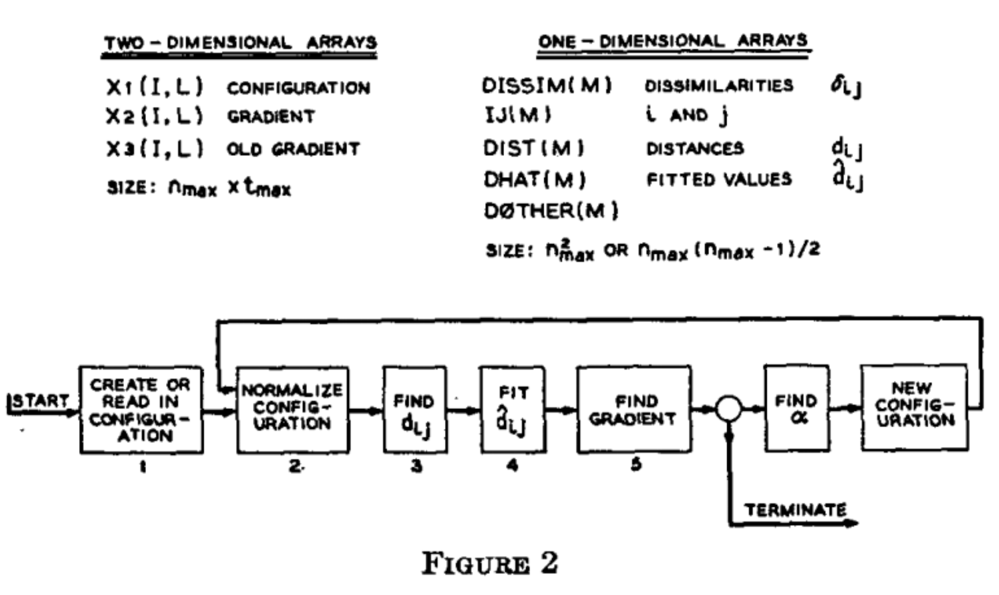
From Kruskal, 1964

Idea is to follow these steps, 

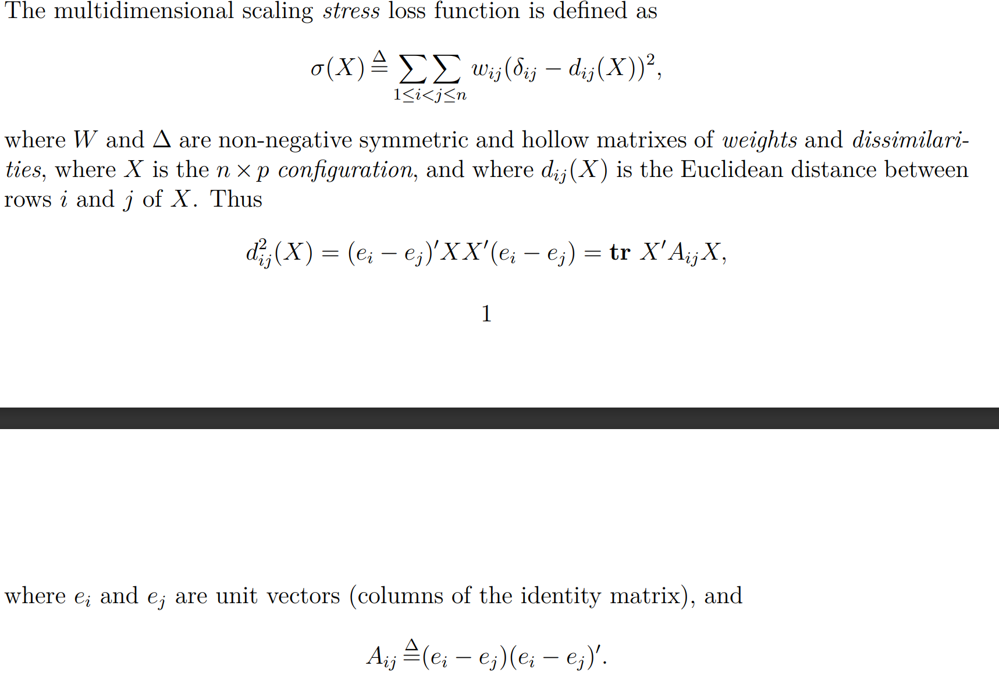
From https://jansweb.netlify.app/publication/deleeuw-e-18-c/
NB: $\delta_{ij}$ here is the true dissimilarity between $i$ and $j$ 

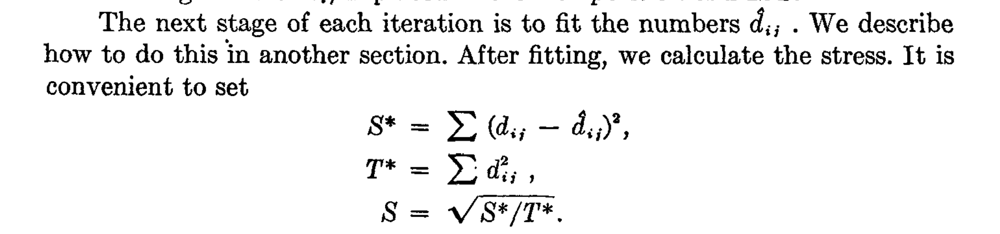
Stress Loss function from Kruskal, 1964

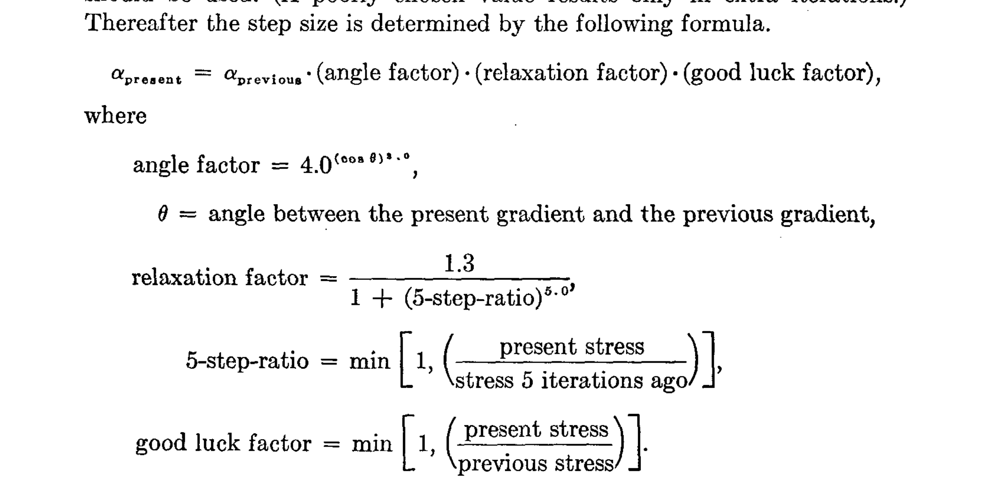
Optimizer from Kruskal, 1964

In [35]:
## Steps 
### Define configuration 
#### for each training iteration
#### normalize 
#### find pairwise distances
#### monotone regression
#### gradient descent



2022-09-01 04:07:07.827 | INFO     | src.autograd_mds:stress:53 - Sstar: 0.5569507945553784
2022-09-01 04:07:07.829 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:07:07.833 | INFO     | src.autograd_mds:my_mds_training_loop:217 - Starting Stress: 0.7462913603649572
2022-09-01 04:07:07.865 | INFO     | src.autograd_mds:stress:53 - Sstar: Autograd ArrayBox with value 0.5569507945553784
2022-09-01 04:07:07.867 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:07:08.052 | INFO     | src.autograd_mds:my_mds_training_loop:220 - Starting Gradient magnitude: 0.7880273203445394


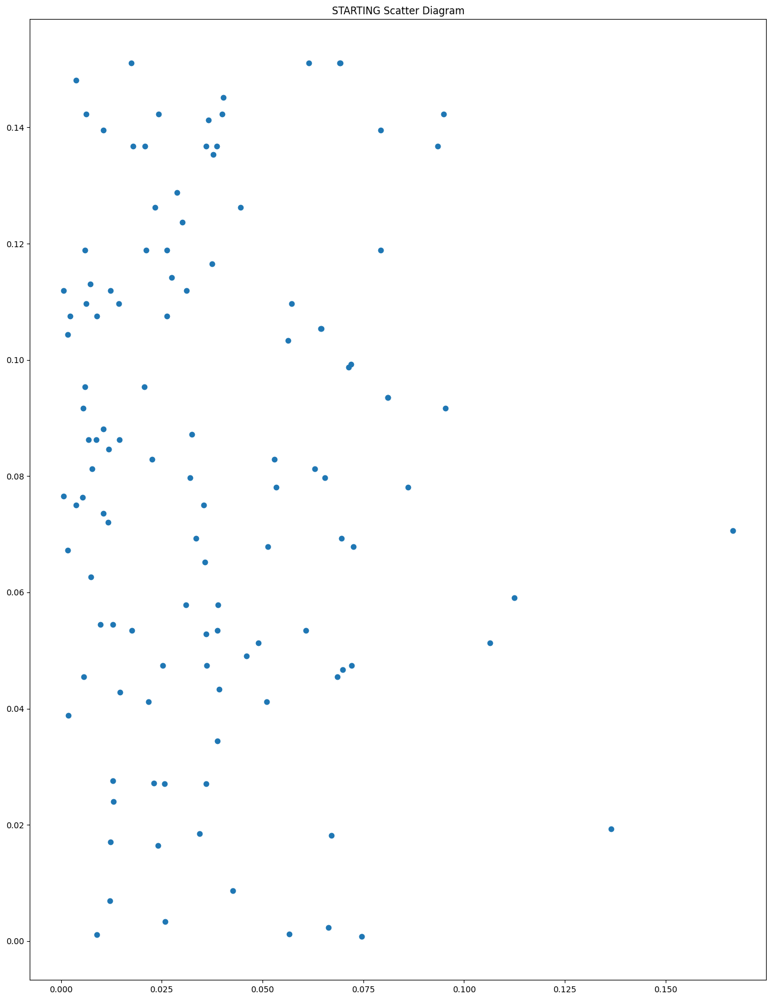

/usr/local/lib/python3.8/dist-packages/numpy/core/numeric.py:2457: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  a1, a2 = asarray(a1), asarray(a2)
2022-09-01 04:07:08.897 | INFO     | src.autograd_mds:stress:53 - Sstar: 0.19637041997892327
2022-09-01 04:07:08.900 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:07:08.904 | INFO     | src.autograd_mds:my_mds_training_loop:238 - stress: 0.44313702167492536
2022-09-01 04:07:08.957 | INFO     | src.autograd_mds:stress:53 - Sstar: Autograd ArrayBox with value 0.5569507945553784
2022-09-01 04:07:08.960 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:07:08.987 | INFO     | src.autograd_mds:my_mds_training_loop:244 - Gradient magnitude: 0.7880273203445394


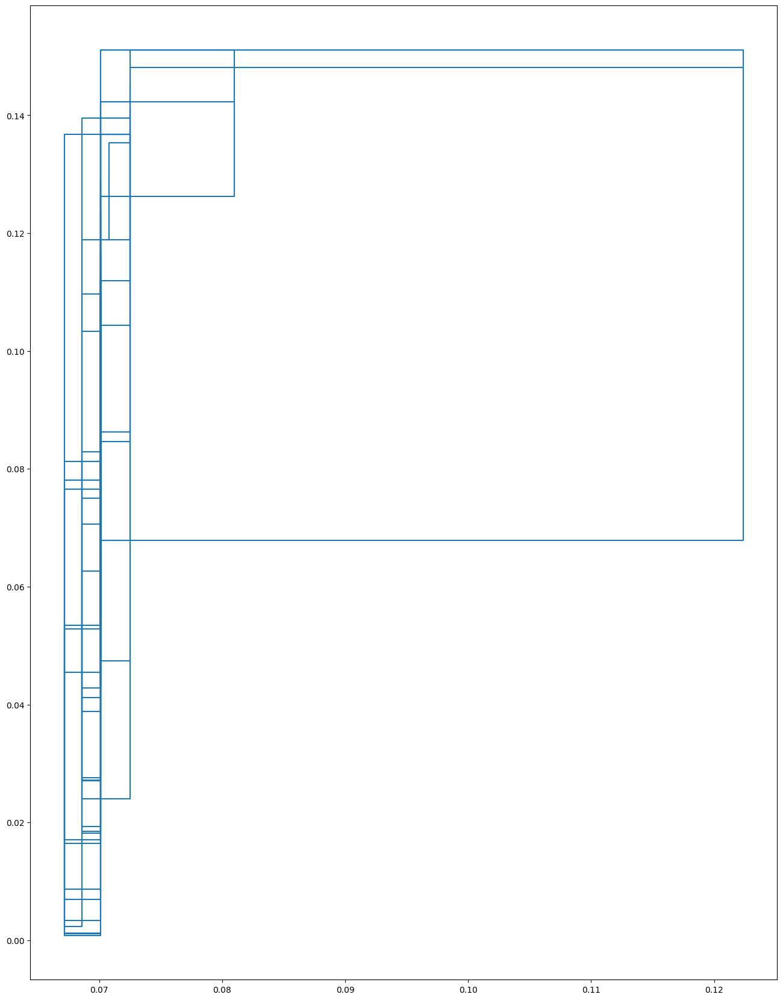

2022-09-01 04:07:09.539 | INFO     | src.autograd_mds:stress:53 - Sstar: 0.12218451135704676
2022-09-01 04:07:09.541 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:07:09.543 | INFO     | src.autograd_mds:my_mds_training_loop:238 - stress: 0.3495490113804454
2022-09-01 04:07:09.576 | INFO     | src.autograd_mds:stress:53 - Sstar: Autograd ArrayBox with value 1624940.1481370898
2022-09-01 04:07:09.578 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:07:09.610 | INFO     | src.autograd_mds:my_mds_training_loop:244 - Gradient magnitude: 117.56611102452689


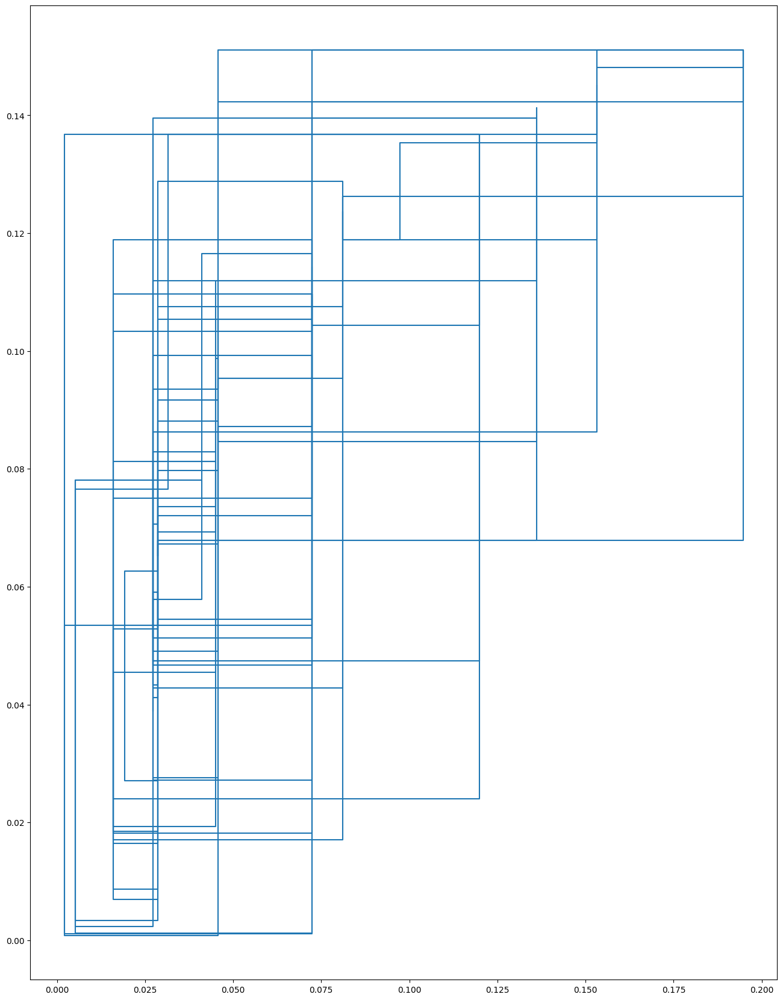

2022-09-01 04:07:10.137 | INFO     | src.autograd_mds:stress:53 - Sstar: 0.2997646023122238
2022-09-01 04:07:10.138 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:07:10.140 | INFO     | src.autograd_mds:my_mds_training_loop:238 - stress: 0.5475076276292631
2022-09-01 04:07:10.163 | INFO     | src.autograd_mds:stress:53 - Sstar: Autograd ArrayBox with value 4.1691064506463895e+64
2022-09-01 04:07:10.164 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0


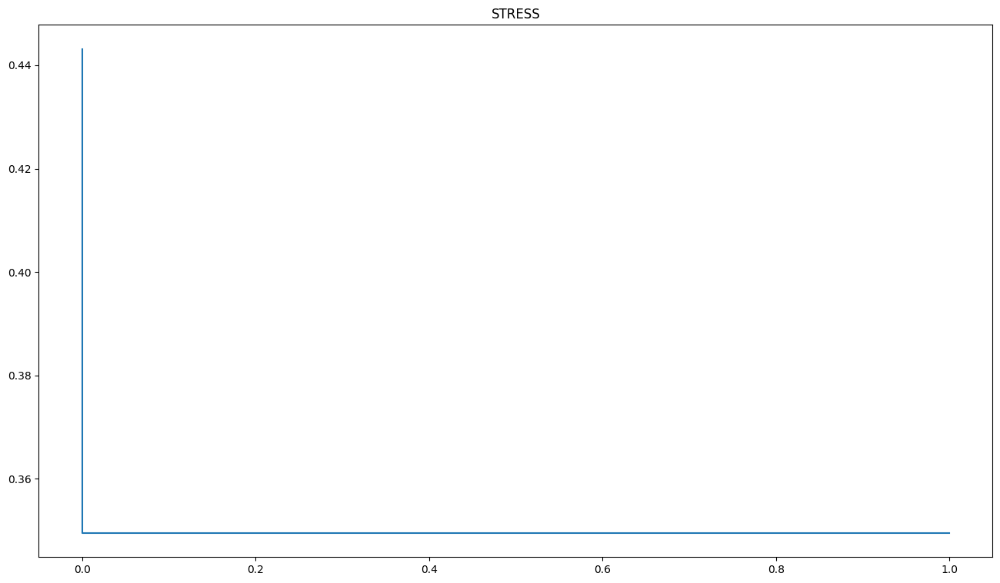

2022-09-01 04:07:10.384 | INFO     | src.autograd_mds:stress:53 - Sstar: 0.4827285230474764
2022-09-01 04:07:10.386 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:07:10.389 | INFO     | src.autograd_mds:my_mds_training_loop:217 - Starting Stress: 0.6947866744889948
2022-09-01 04:07:10.430 | INFO     | src.autograd_mds:stress:53 - Sstar: Autograd ArrayBox with value 0.4827285230474764
2022-09-01 04:07:10.432 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:07:10.466 | INFO     | src.autograd_mds:my_mds_training_loop:220 - Starting Gradient magnitude: 1.0297391231816193


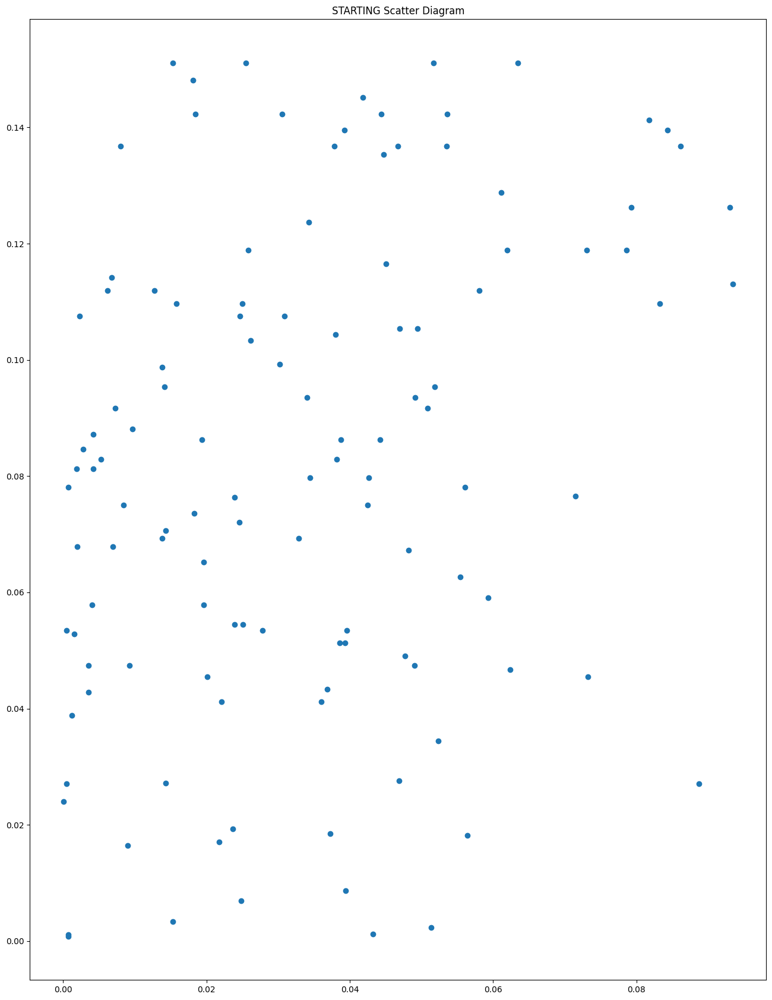

2022-09-01 04:07:11.204 | INFO     | src.autograd_mds:stress:53 - Sstar: 0.08376408098104923
2022-09-01 04:07:11.205 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:07:11.207 | INFO     | src.autograd_mds:my_mds_training_loop:238 - stress: 0.2894202497771178
2022-09-01 04:07:11.237 | INFO     | src.autograd_mds:stress:53 - Sstar: Autograd ArrayBox with value 0.4827285230474764
2022-09-01 04:07:11.238 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:07:11.276 | INFO     | src.autograd_mds:my_mds_training_loop:244 - Gradient magnitude: 1.0297391231816193


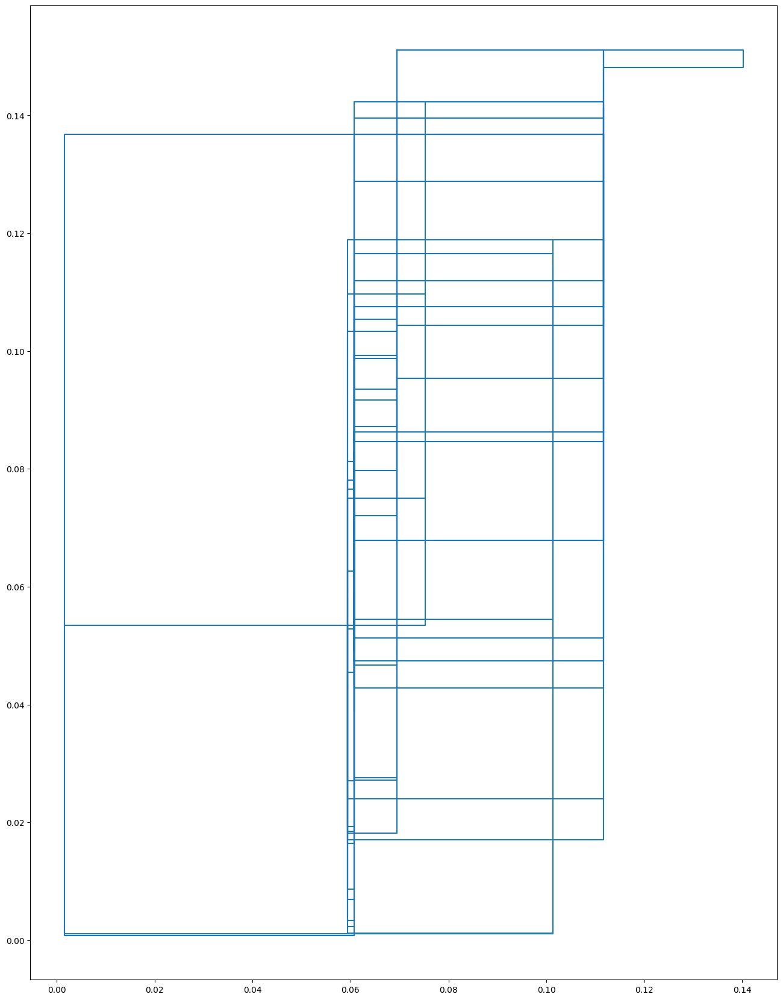

2022-09-01 04:07:12.034 | INFO     | src.autograd_mds:stress:53 - Sstar: 0.12257716693664694
2022-09-01 04:07:12.036 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:07:12.037 | INFO     | src.autograd_mds:my_mds_training_loop:238 - stress: 0.35011022112564344
2022-09-01 04:07:12.080 | INFO     | src.autograd_mds:stress:53 - Sstar: Autograd ArrayBox with value 2813676.3364829635
2022-09-01 04:07:12.083 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:07:12.128 | INFO     | src.autograd_mds:my_mds_training_loop:244 - Gradient magnitude: 128.04025674543888


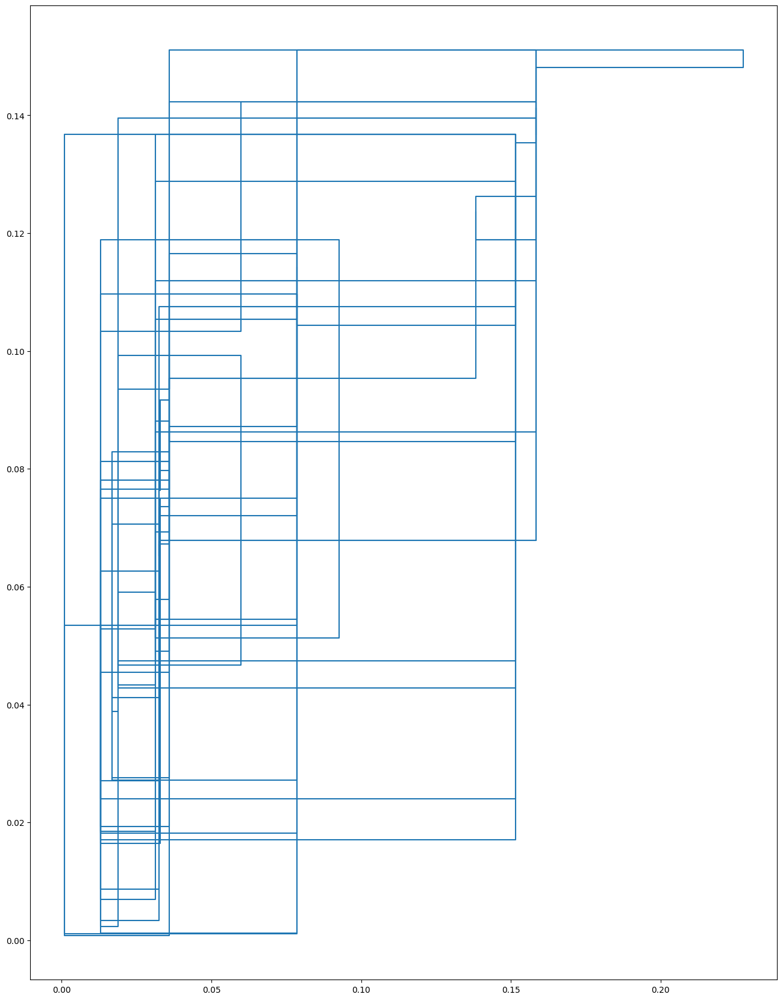

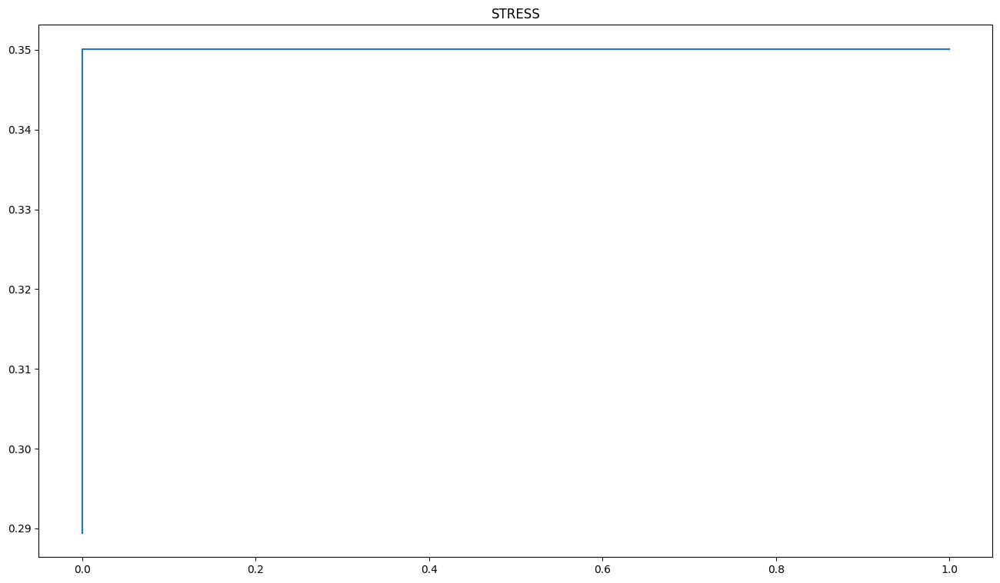

2022-09-01 04:07:12.722 | INFO     | src.autograd_mds:stress:53 - Sstar: 0.6285138202960459
2022-09-01 04:07:12.725 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:07:12.727 | INFO     | src.autograd_mds:my_mds_training_loop:217 - Starting Stress: 0.7927886353222061
2022-09-01 04:07:12.775 | INFO     | src.autograd_mds:stress:53 - Sstar: Autograd ArrayBox with value 0.6285138202960459
2022-09-01 04:07:12.776 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:07:12.805 | INFO     | src.autograd_mds:my_mds_training_loop:220 - Starting Gradient magnitude: 0.5858643763550563


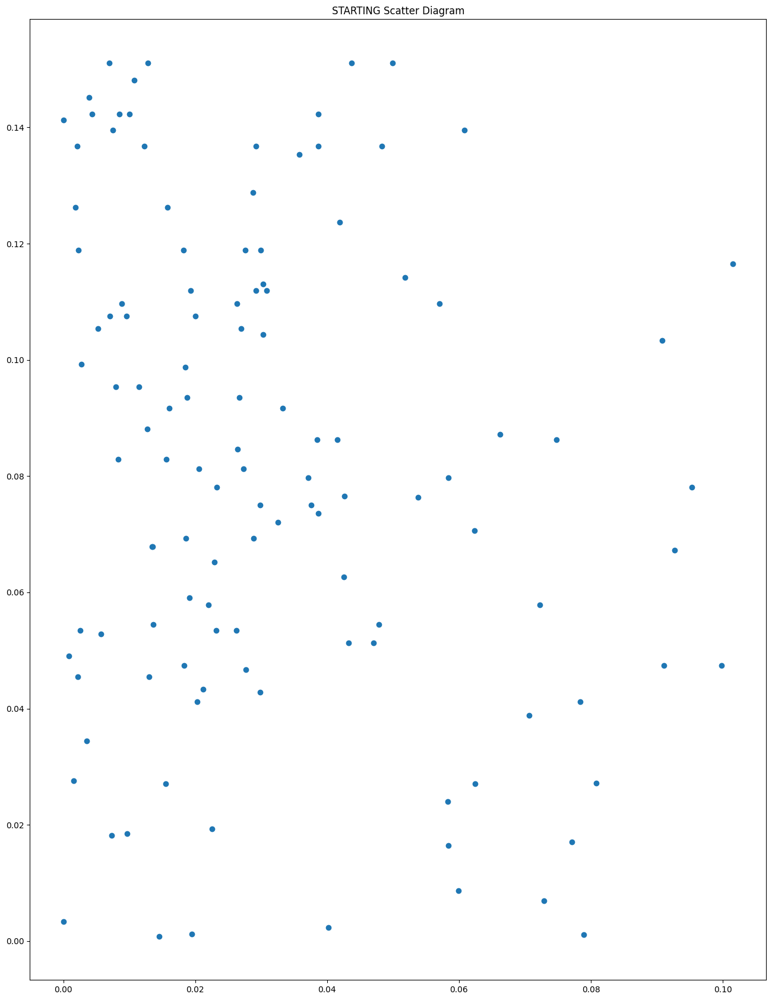

2022-09-01 04:07:13.636 | INFO     | src.autograd_mds:stress:53 - Sstar: 0.20825287136633533
2022-09-01 04:07:13.638 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:07:13.642 | INFO     | src.autograd_mds:my_mds_training_loop:238 - stress: 0.45634731440684007
2022-09-01 04:07:13.674 | INFO     | src.autograd_mds:stress:53 - Sstar: Autograd ArrayBox with value 0.6285138202960459
2022-09-01 04:07:13.675 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:07:13.697 | INFO     | src.autograd_mds:my_mds_training_loop:244 - Gradient magnitude: 0.5858643763550563


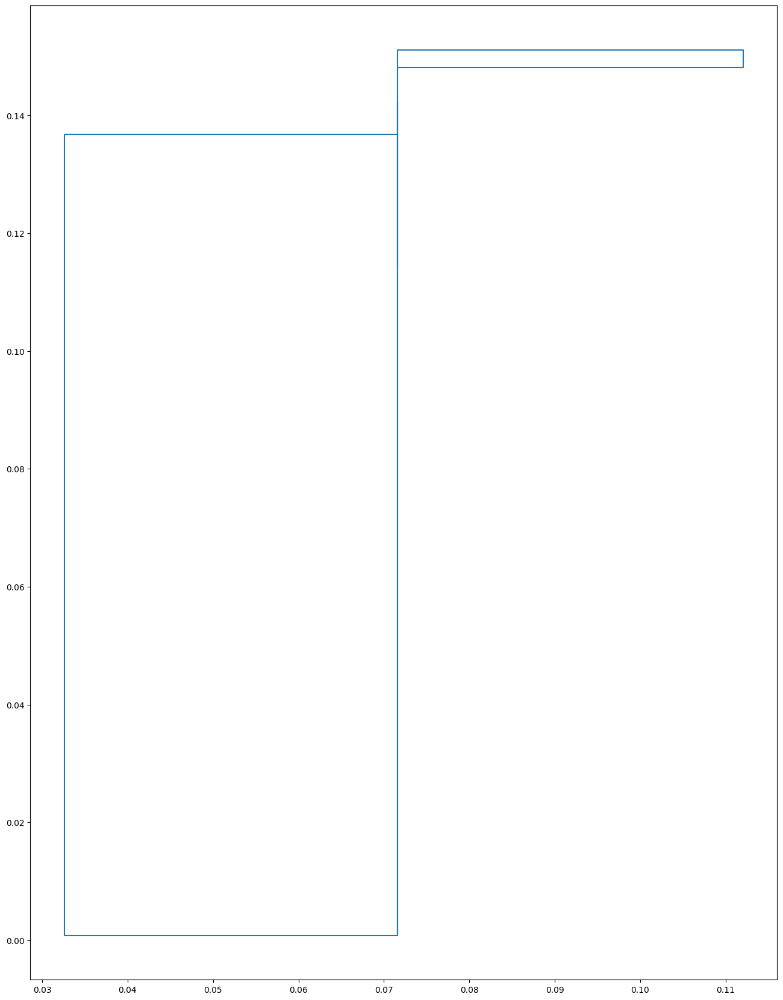

2022-09-01 04:07:14.311 | INFO     | src.autograd_mds:stress:53 - Sstar: 0.07544621067737908
2022-09-01 04:07:14.315 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:07:14.317 | INFO     | src.autograd_mds:my_mds_training_loop:238 - stress: 0.2746747361469181
2022-09-01 04:07:14.340 | INFO     | src.autograd_mds:stress:53 - Sstar: Autograd ArrayBox with value 149187.86022575895
2022-09-01 04:07:14.342 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:07:14.368 | INFO     | src.autograd_mds:my_mds_training_loop:244 - Gradient magnitude: 60.165831666821205


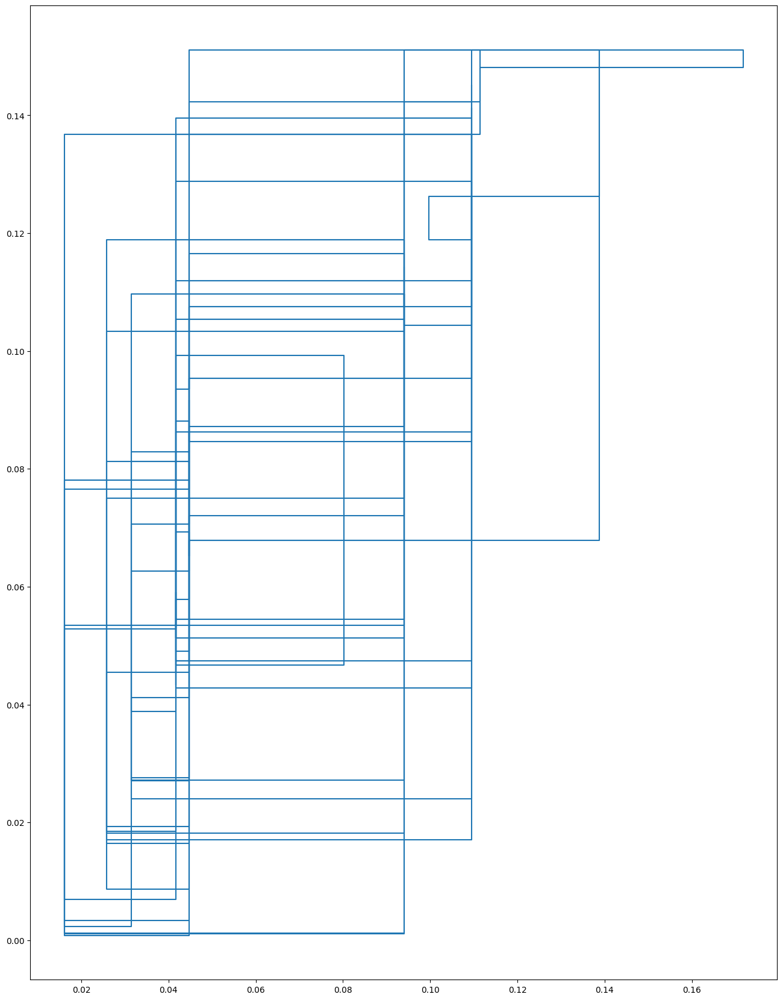

2022-09-01 04:07:14.869 | INFO     | src.autograd_mds:stress:53 - Sstar: 0.1587655379821534
2022-09-01 04:07:14.871 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:07:14.873 | INFO     | src.autograd_mds:my_mds_training_loop:238 - stress: 0.39845393457983747
2022-09-01 04:07:14.903 | INFO     | src.autograd_mds:stress:53 - Sstar: Autograd ArrayBox with value 4.023902782947825e+40
2022-09-01 04:07:14.905 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0


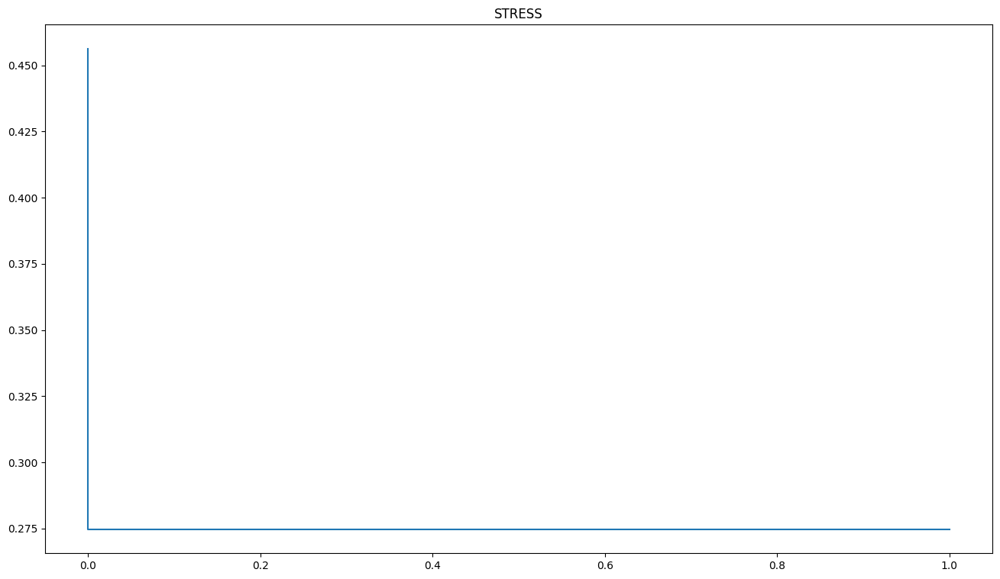

2022-09-01 04:07:15.333 | INFO     | src.autograd_mds:stress:53 - Sstar: 0.5706589810221988
2022-09-01 04:07:15.337 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:07:15.340 | INFO     | src.autograd_mds:my_mds_training_loop:217 - Starting Stress: 0.7554197383059293
2022-09-01 04:07:15.424 | INFO     | src.autograd_mds:stress:53 - Sstar: Autograd ArrayBox with value 0.5706589810221988
2022-09-01 04:07:15.428 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:07:15.486 | INFO     | src.autograd_mds:my_mds_training_loop:220 - Starting Gradient magnitude: 0.8671163671959529


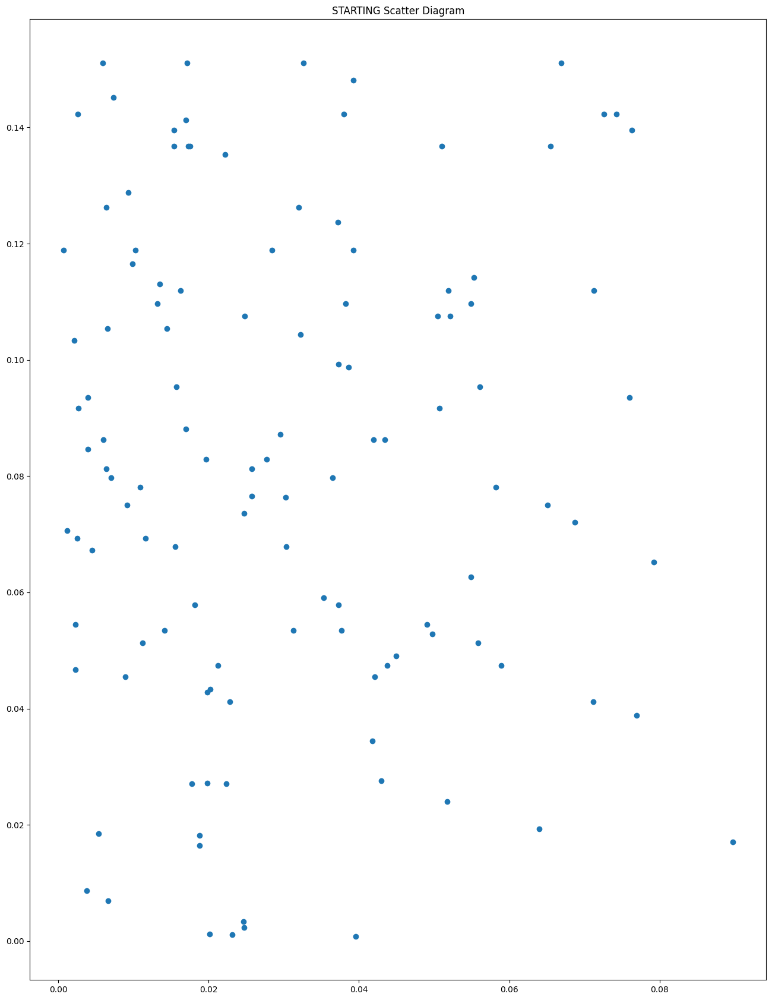

2022-09-01 04:07:16.588 | INFO     | src.autograd_mds:stress:53 - Sstar: 0.16846507346246709
2022-09-01 04:07:16.590 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:07:16.591 | INFO     | src.autograd_mds:my_mds_training_loop:238 - stress: 0.4104449700781666
2022-09-01 04:07:16.625 | INFO     | src.autograd_mds:stress:53 - Sstar: Autograd ArrayBox with value 0.5706589810221988
2022-09-01 04:07:16.626 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:07:16.667 | INFO     | src.autograd_mds:my_mds_training_loop:244 - Gradient magnitude: 0.8671163671959529


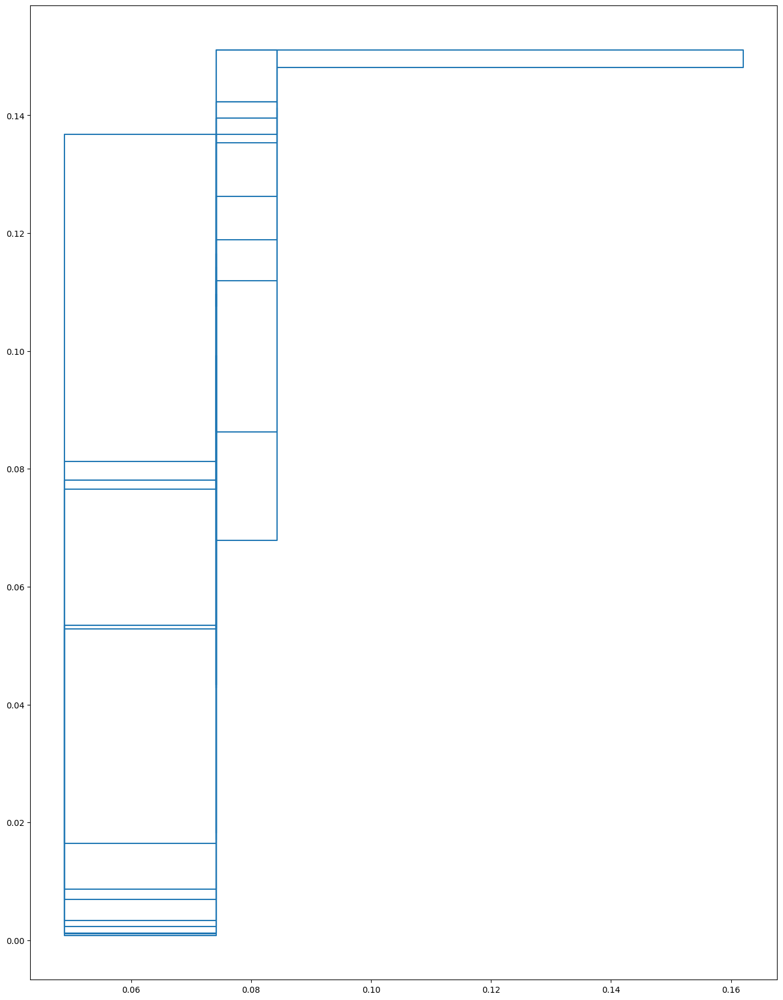

2022-09-01 04:07:17.570 | INFO     | src.autograd_mds:stress:53 - Sstar: 0.07439610699140477
2022-09-01 04:07:17.573 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:07:17.575 | INFO     | src.autograd_mds:my_mds_training_loop:238 - stress: 0.27275649761537263
2022-09-01 04:07:17.610 | INFO     | src.autograd_mds:stress:53 - Sstar: Autograd ArrayBox with value 1868127.5151437502
2022-09-01 04:07:17.612 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:07:17.647 | INFO     | src.autograd_mds:my_mds_training_loop:244 - Gradient magnitude: 110.39175187257999


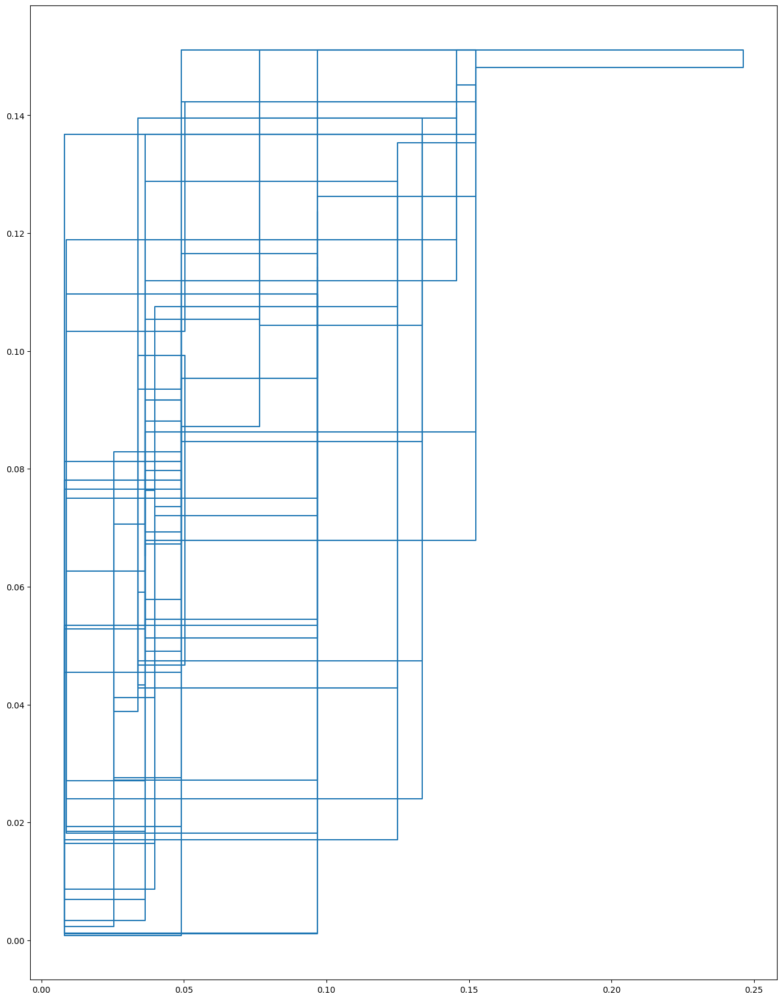

2022-09-01 04:07:18.358 | INFO     | src.autograd_mds:stress:53 - Sstar: 0.18187081925731002
2022-09-01 04:07:18.359 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:07:18.361 | INFO     | src.autograd_mds:my_mds_training_loop:238 - stress: 0.42646315111309446
2022-09-01 04:07:18.397 | INFO     | src.autograd_mds:stress:53 - Sstar: Autograd ArrayBox with value 1.0958125268579215e+68
2022-09-01 04:07:18.401 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0


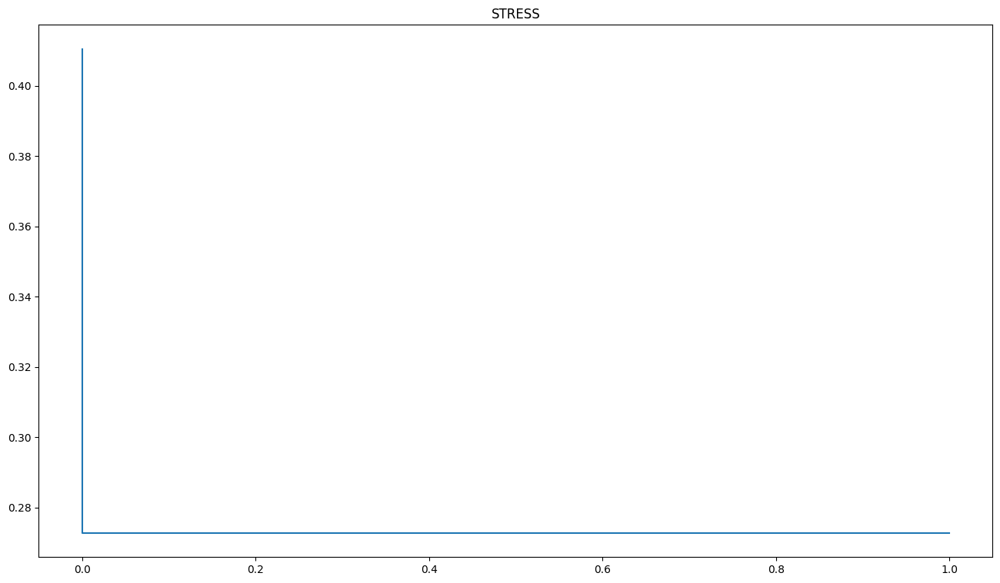

2022-09-01 04:07:18.825 | INFO     | src.autograd_mds:stress:53 - Sstar: 0.5577820535190541
2022-09-01 04:07:18.828 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:07:18.832 | INFO     | src.autograd_mds:my_mds_training_loop:217 - Starting Stress: 0.7468480792765381
2022-09-01 04:07:18.862 | INFO     | src.autograd_mds:stress:53 - Sstar: Autograd ArrayBox with value 0.5577820535190541
2022-09-01 04:07:18.865 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:07:18.895 | INFO     | src.autograd_mds:my_mds_training_loop:220 - Starting Gradient magnitude: 0.9586377203881238


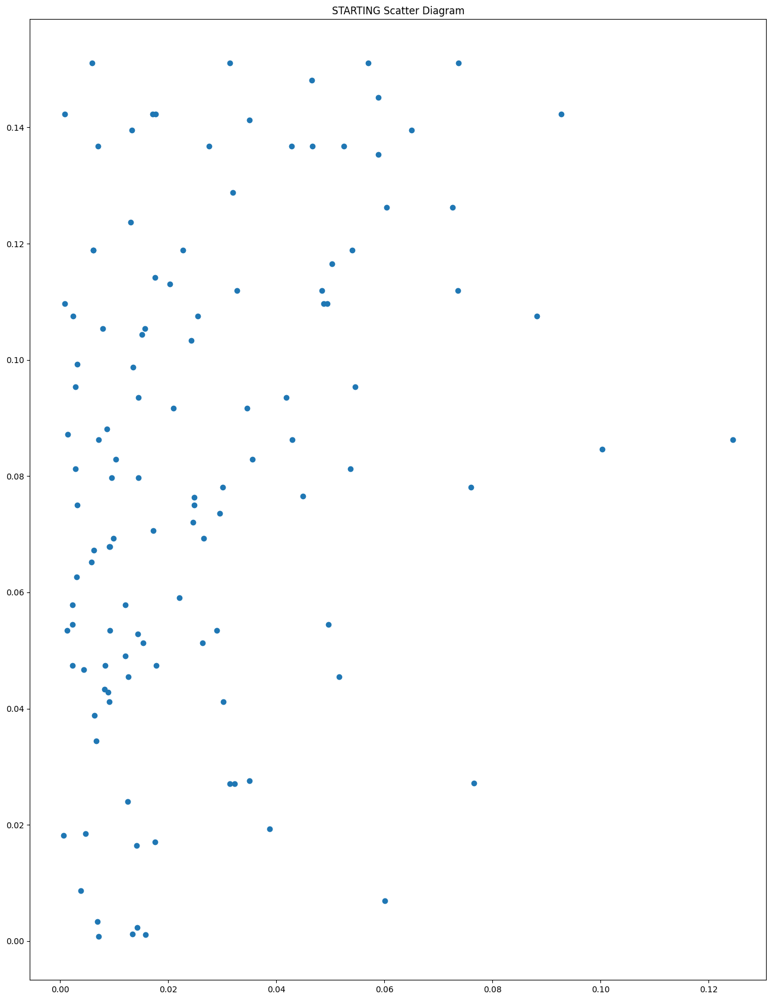

2022-09-01 04:07:19.627 | INFO     | src.autograd_mds:stress:53 - Sstar: 0.07037978017288044
2022-09-01 04:07:19.628 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:07:19.630 | INFO     | src.autograd_mds:my_mds_training_loop:238 - stress: 0.26529187732171605
2022-09-01 04:07:19.651 | INFO     | src.autograd_mds:stress:53 - Sstar: Autograd ArrayBox with value 0.5577820535190541
2022-09-01 04:07:19.654 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:07:19.688 | INFO     | src.autograd_mds:my_mds_training_loop:244 - Gradient magnitude: 0.9586377203881238


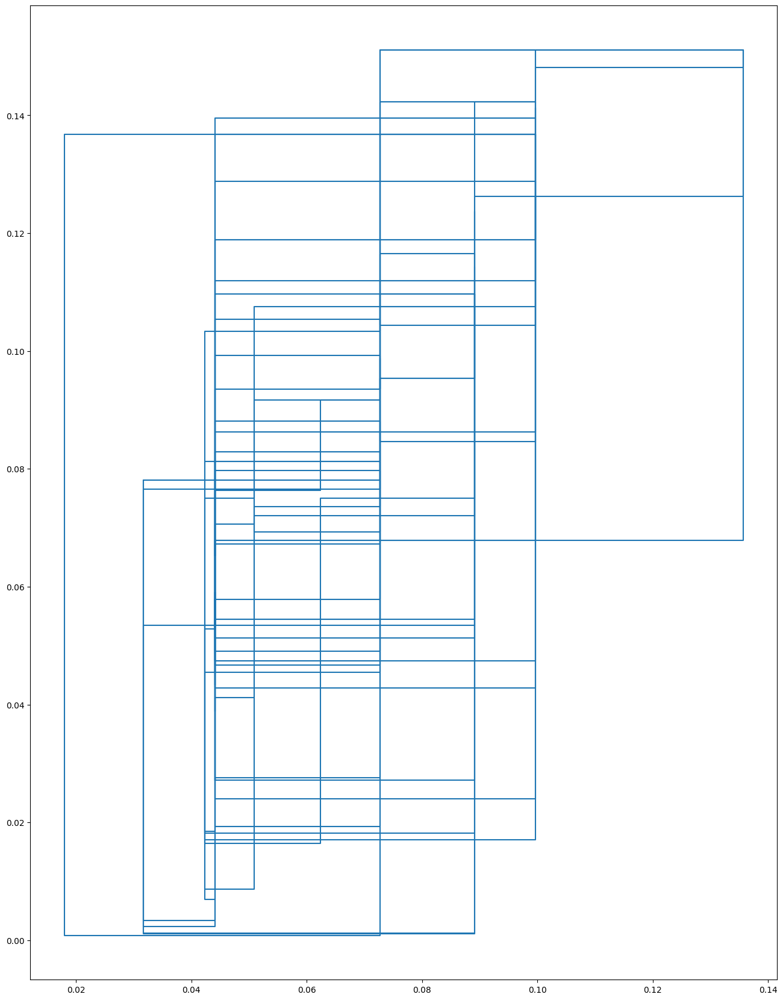

2022-09-01 04:07:20.340 | INFO     | src.autograd_mds:stress:53 - Sstar: 0.1281641857573679
2022-09-01 04:07:20.342 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:07:20.343 | INFO     | src.autograd_mds:my_mds_training_loop:238 - stress: 0.3580002594375707
2022-09-01 04:07:20.369 | INFO     | src.autograd_mds:stress:53 - Sstar: Autograd ArrayBox with value 859814.9597126546
2022-09-01 04:07:20.370 | INFO     | src.autograd_mds:stress:55 - Tstar: 1.0
2022-09-01 04:07:20.401 | INFO     | src.autograd_mds:my_mds_training_loop:244 - Gradient magnitude: 96.68450710964498


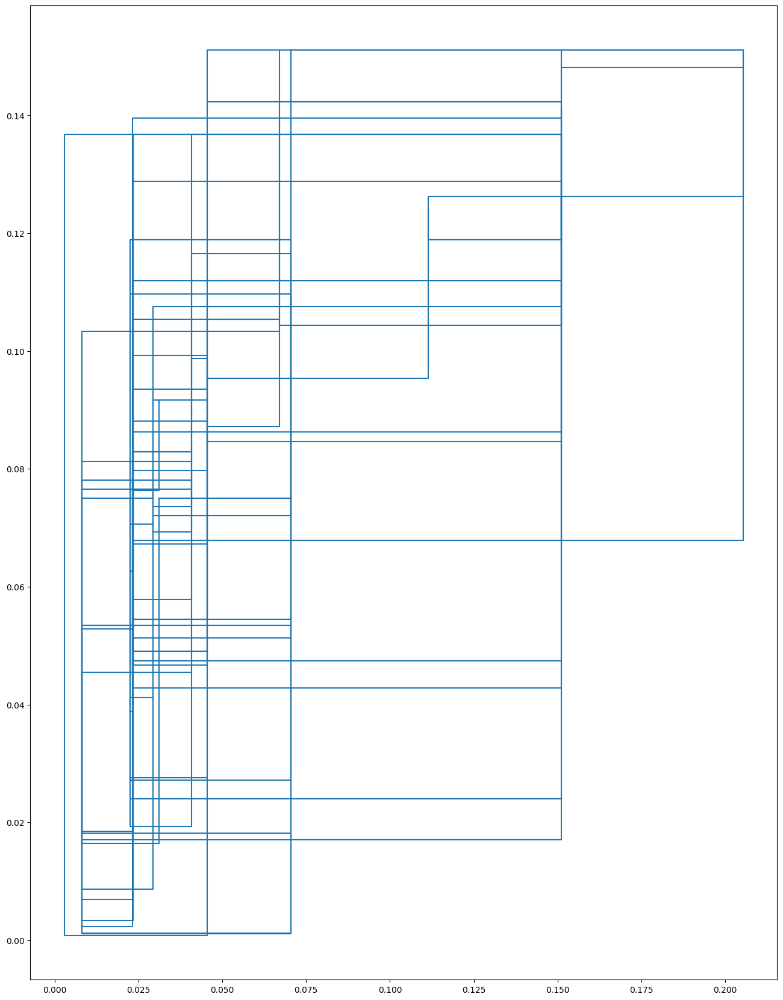

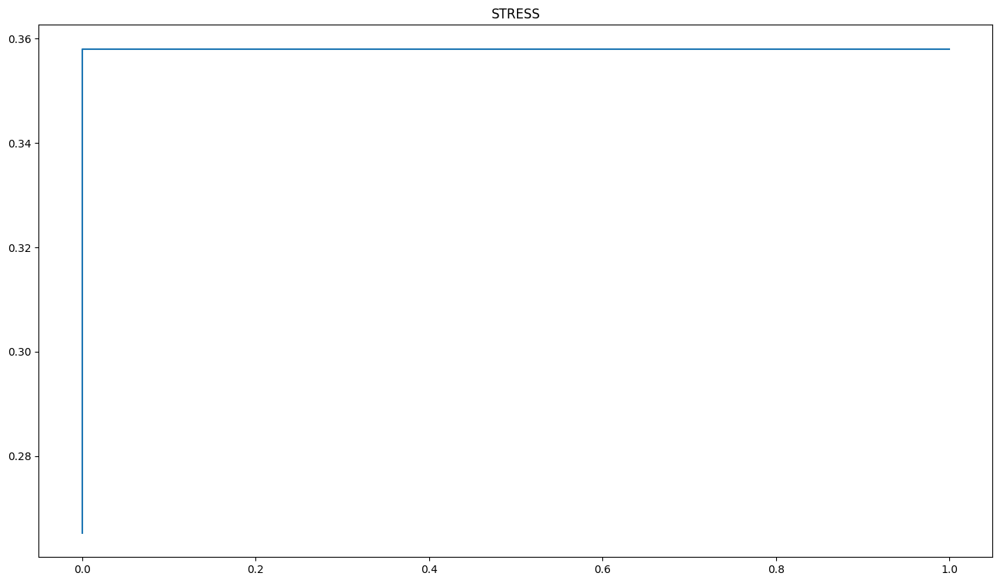

In [36]:
loop_config = my_mds_training_loop(dissimilarity_vec, n_init=5,eps =.01,dim=2)

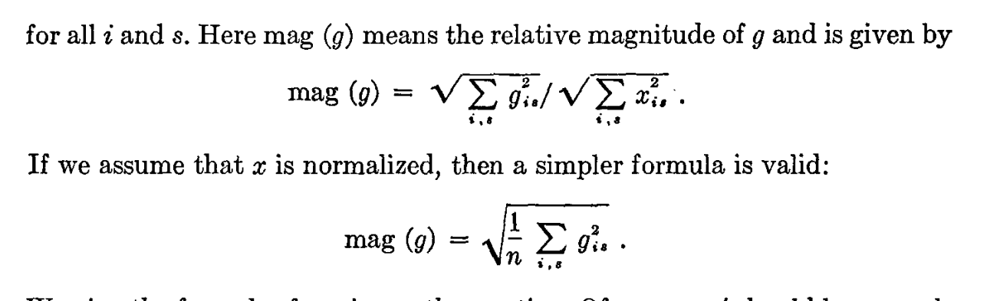

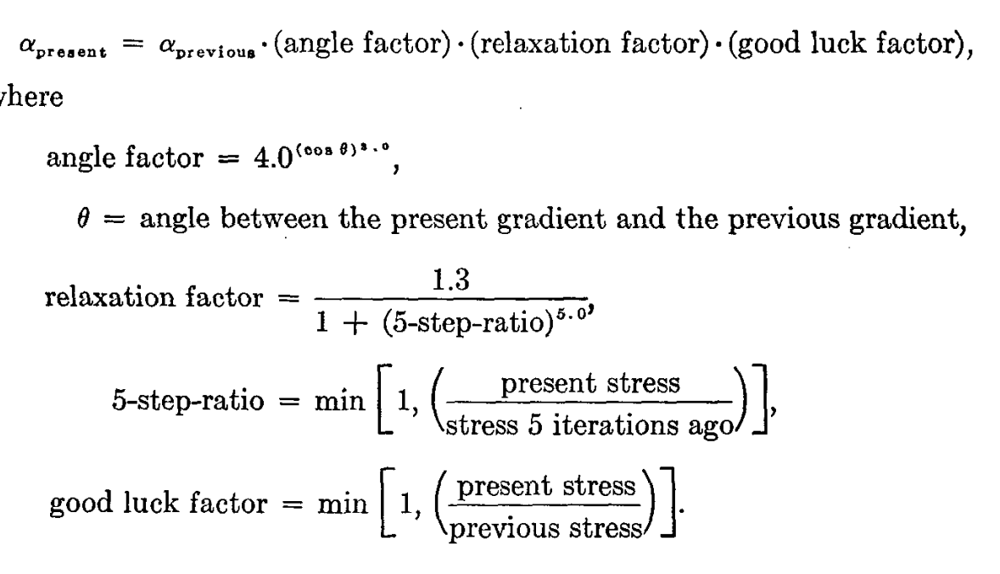

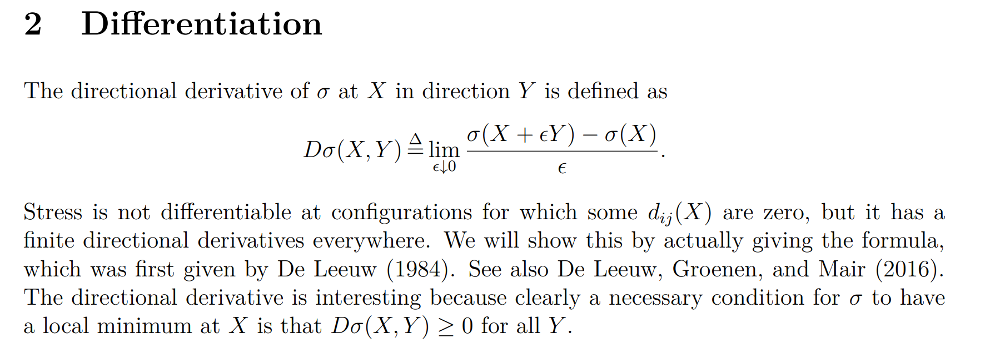
From https://jansweb.netlify.app/publication/deleeuw-e-18-c/

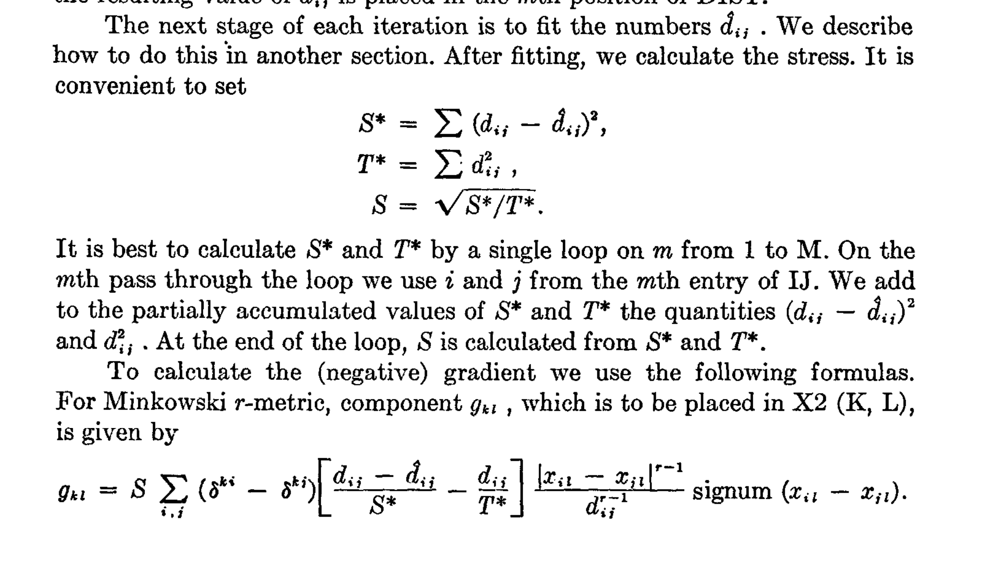
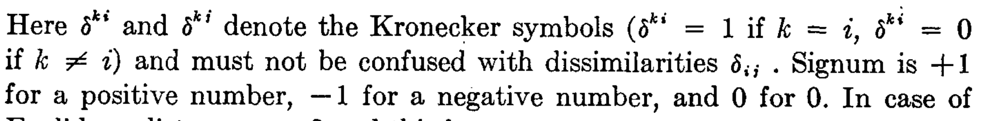
From Kruskal, 1964

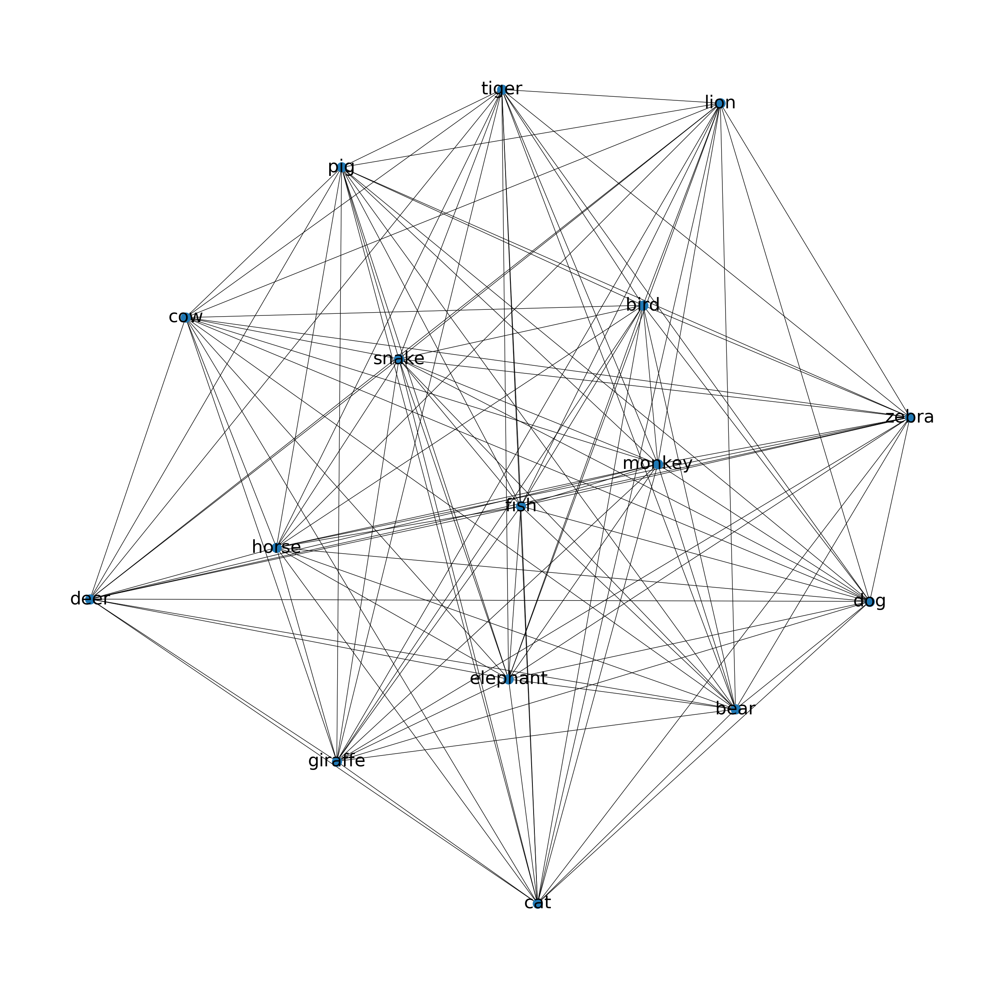

In [37]:
fig, ax = plt.subplots(figsize=(32,32))
nx.draw(animal_pairs.subgraph(big_matrix.index.to_list()), with_labels=True, ax=ax, font_size=32,
       pos=nx.spring_layout(animal_pairs.subgraph(big_matrix.index.to_list())))

plt.show()

In [38]:
refMDS = MDS(dissimilarity="precomputed",metric=False,)

In [39]:
dissimilarity_mat = np.exp(-1*np.nan_to_num(similarities)) - np.eye(similarities.shape[0])

In [40]:
plt.matshow(dissimilarity_mat)

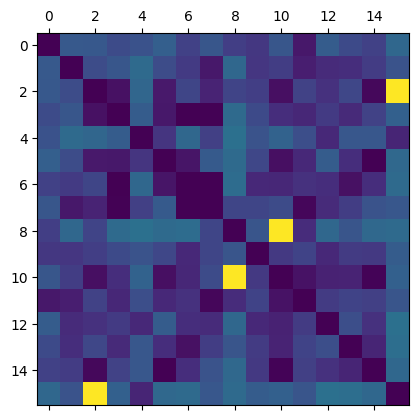

In [41]:
plt.show()

In [42]:
new_config = refMDS.fit_transform(dissimilarity_mat)

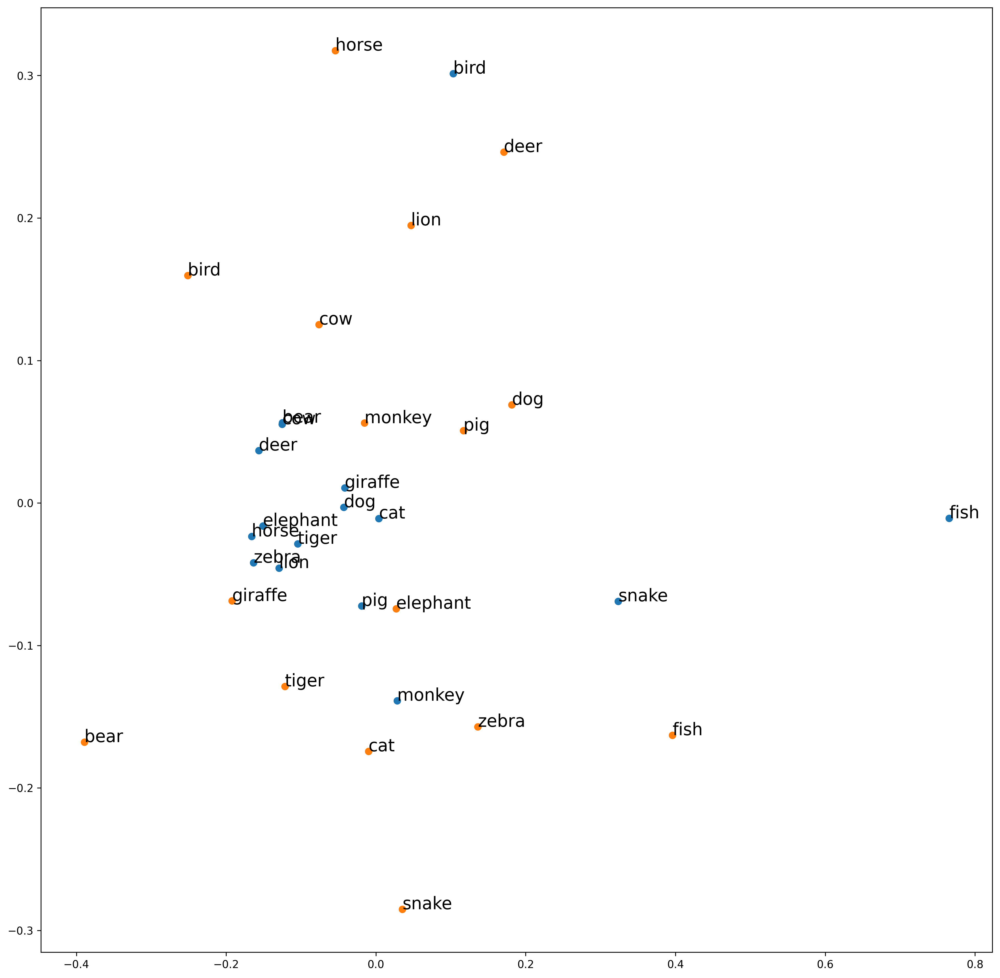

In [43]:
new_config /= np.sqrt((new_config**2).sum())
loop_config /= np.sqrt((loop_config**2).sum())
# Rotate the data
clf = PCA(n_components=2)

new_config = clf.fit_transform(new_config)
loop_config = clf.fit_transform(loop_config)

fig, ax = plt.subplots(figsize=(16,16), dpi=300)
ax.scatter(x=loop_config[:,0], y=loop_config[:,1])
for i, label in enumerate(big_matrix.index.to_list()):
       ax.annotate(label, (loop_config[i,0], loop_config[i,1]), fontsize=16)

# ax.set_yscale('log')
# ax.set_xscale('log')

ax.scatter(x=new_config[:,0], y=new_config[:,1])
for i, label in enumerate(big_matrix.index.to_list()):
       ax.annotate(label, (new_config[i,0], new_config[i,1]), fontsize=16)

# ax.set_yscale('log')
# ax.set_xscale('log')
plt.show()

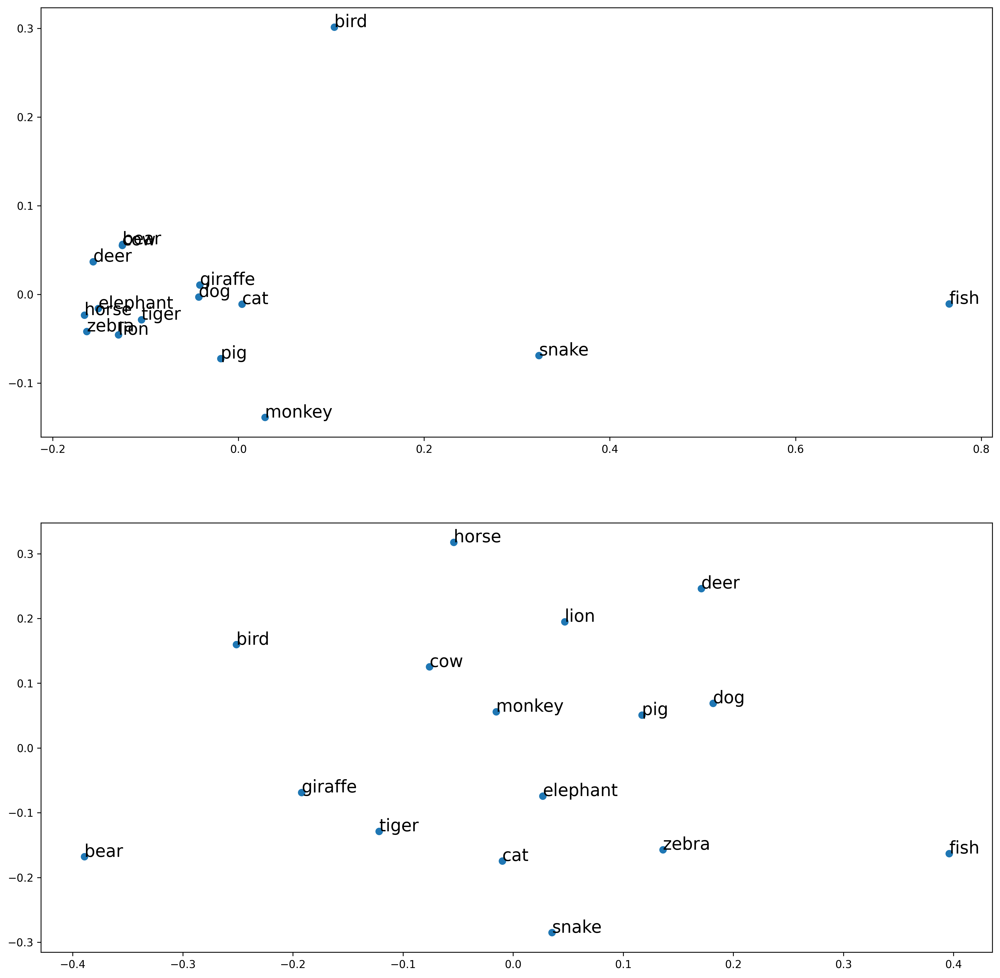

In [44]:
new_config /= np.sqrt((new_config**2).sum())
loop_config /= np.sqrt((loop_config**2).sum())
# Rotate the data
clf = PCA(n_components=2)

new_config = clf.fit_transform(new_config)
loop_config = clf.fit_transform(loop_config)

fig, ax = plt.subplots(2,1,figsize=(16,16), dpi=300)
ax[0].scatter(x=loop_config[:,0], y=loop_config[:,1])
for i, label in enumerate(big_matrix.index.to_list()):
       ax[0].annotate(label, (loop_config[i,0], loop_config[i,1]), fontsize=16)

# ax.set_yscale('log')
# ax.set_xscale('log')

ax[1].scatter(x=new_config[:,0], y=new_config[:,1])
for i, label in enumerate(big_matrix.index.to_list()):
       ax[1].annotate(label, (new_config[i,0], new_config[i,1]), fontsize=16)

# ax.set_yscale('log')
# ax.set_xscale('log')
plt.show()